In [1]:
import pandas as pd
import os
from IPython.display import Image, display
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
# リストを渡すと画像を一覧表示する関数
def image_explorer(filename_list):
    for image_file in filename_list:
        file_path = os.path.join(path, image_file)
        display(Image.open(file_path))

In [10]:
# タイルで一覧表示する関数
def image_explorer_tile(filename_list):
    num_images = len(df_filtered_count)
    num_rows = 2
    num_cols = int(np.ceil(num_images / num_rows))

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))

    for i, image_file in enumerate(filename_list):
        file_path = os.path.join(path, image_file)
        image = Image.open(file_path)

        ax = axes[i // num_cols, i % num_cols]
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(image_file)  # キャプションに画像ファイル名を設定

    # 空のサブプロットを非表示にする
    for j in range(num_images, num_rows * num_cols):
        axes[j // num_cols, j % num_cols].axis('off')

    # タイトルを設定
    plt.suptitle('Filtered Images', fontsize=16)

    # タイトルと余白の調整
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # 画像を表示
    plt.show()

In [12]:
path = '../data/cat/'

# メタデータ読み込み
df_meta = pd.read_csv('../data/list.csv')
df_meta['image_basename'] = df_meta['image'].apply(lambda x: os.path.basename(x))

# 横持ちに変換
df_wide = df_meta.pivot(index='image', columns='label', values='score').reset_index()
df_wide

label,image,Cat,Dog
0,./data/cat/000001.jpg,0.1,0.3
1,./data/cat/000002.jpg,0.2,0.4
2,./data/cat/000003.jpg,0.3,0.5
3,./data/cat/000004.jpg,0.4,0.6
4,./data/cat/000005.jpg,0.5,0.7
5,./data/cat/000006.jpg,0.6,0.1
6,./data/cat/000007.jpg,0.7,0.2
7,./data/cat/000008.jpg,0.8,0.8
8,./data/cat/000009.jpg,0.9,0.9
9,./data/cat/000010.jpg,1.0,1.0


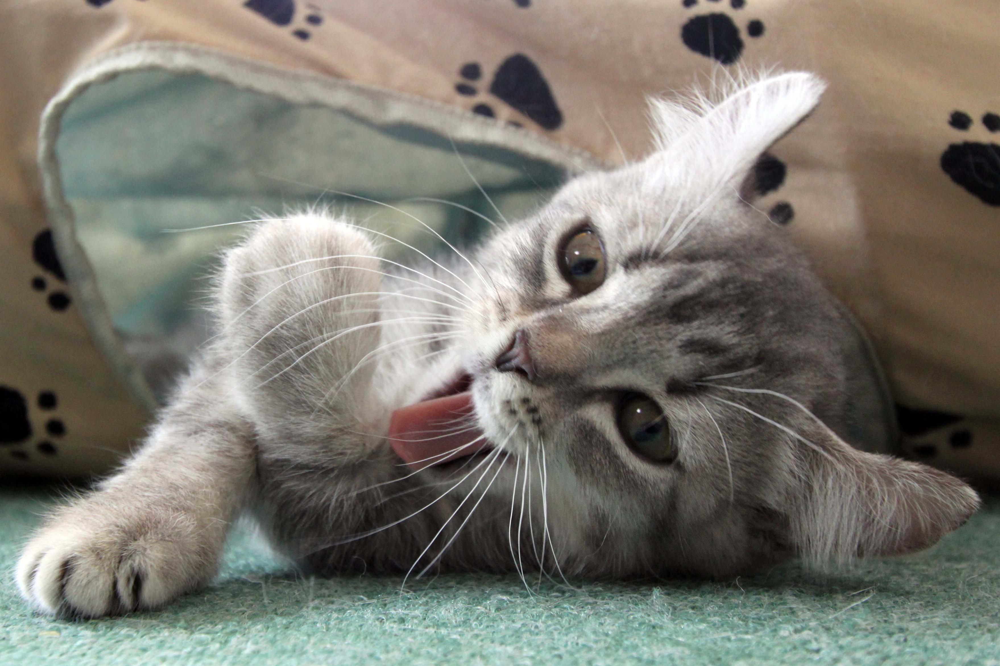

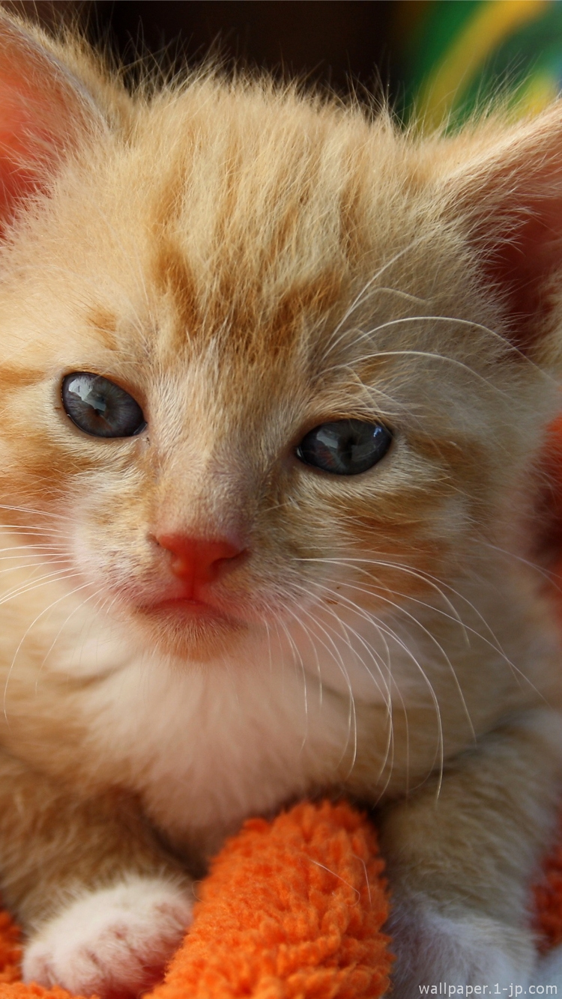

In [14]:
# 複数条件を指定して画像を表示
filters = [('Cat', '>', 0.5), ('Dog', '<=', 0.5)]
n_filter = len(filters)

filter_conditions = []
for label, operator, value in filters:
    filter_conditions.append(f"(label == '{label}' and score {operator} {value})")

string_filter = ' or '.join(filter_conditions)
# print(string_filter)

df_filtered_count = df_meta.query(string_filter).value_counts('image_basename')
df_filtered_count = df_filtered_count[df_filtered_count == n_filter]

image_explorer(df_filtered_count.index.tolist())

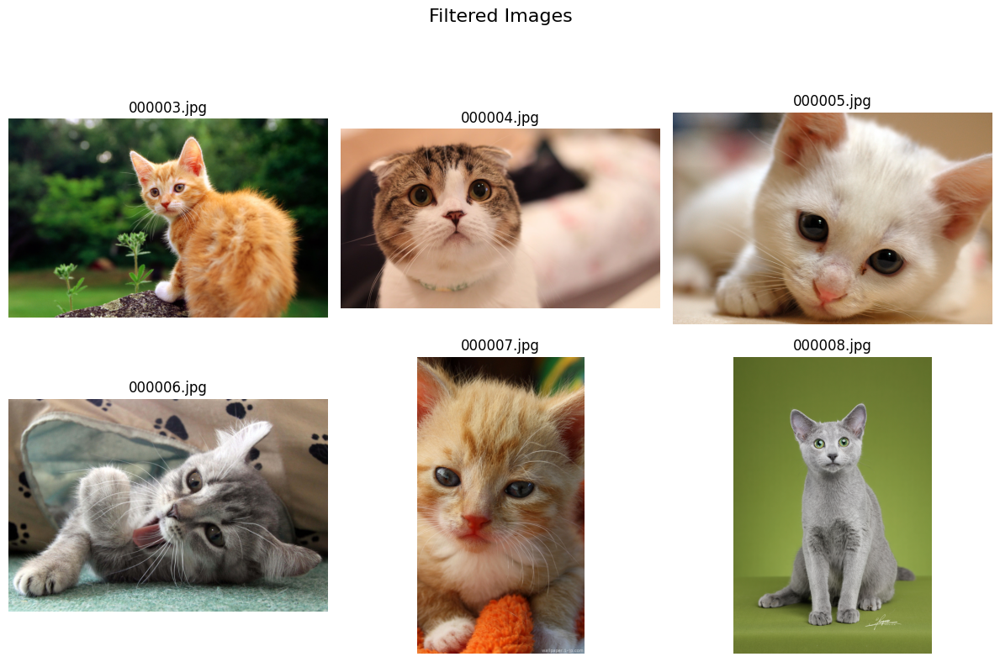

In [11]:
image_explorer_tile(df_filtered_count.index.tolist())